# Clasificacion de ordenes

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
from sklearn.preprocessing import LabelEncoder
import os
import pyodbc

## Data preparation

### SQL Connection

In [4]:
# Had to increase timeout
connection = pyodbc.connect('Driver={SQL Server};'
'Server=LAPTOP-E8KMOCEO;'
'Database=RepuestosWeb;'
'Trusted_Connection=yes;', timeout=5000)

### Data frame creation

In [10]:
#Get view as dataframe
df_ordenes = pd.read_sql('select * from VW_OrdenesEncimaPromedio', connection)
#drop Total_Orden
df_ordenes.drop('Total_Orden', axis=1, inplace=True)
#df_ordenes.head(5)

,NombreCiudad,Genero,ID_Parte,ID_Categoria,TotalEncimaPromedio
0,Birmingham,M,ACC010043,5616,1
1,New York,F,AC1241122,3505,0
2,Raleigh,F,AC2819117-ORIG.REC,5578,0
3,St. Louis,F,ACK011312,7346,1
4,Aurora,F,AC1248114,1356,1


### Variables

In [15]:
#Store x and y variables
x = df_ordenes.iloc[:, 0:4].values
y = df_ordenes.iloc[:, -1].values

### Econding

In [22]:
#Encode no numeric variables
le = LabelEncoder()
x[:,0] = le.fit_transform(x[:,0])
x[:,1] = le.fit_transform(x[:,1])
x[:,2] = le.fit_transform(x[:,2])
x[:,3] = le.fit_transform(x[:,3])

### Data splitting

In [18]:
#Split data 80/20 with scikit
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0)

## Naive Bayes

In [31]:
#Create NB model
from sklearn.naive_bayes import GaussianNB
NB_classifier = GaussianNB()
NB_classifier.fit(x_train, y_train)

GaussianNB()

In [38]:
#Predict with bayes
NB_pred = NB_classifier.predict(x_test)

In [39]:
#Create confusion and precision matrix
from sklearn.metrics import confusion_matrix, accuracy_score
NB_cm = confusion_matrix(y_test, NB_pred)
NB_ac = accuracy_score(y_test, NB_pred)

In [40]:
#Confusion matrix
NB_cm

array([[236, 964],
       [221, 961]], dtype=int64)

In [41]:
#Accuracy
NB_ac

0.5025188916876574

### Confusion matrix plot

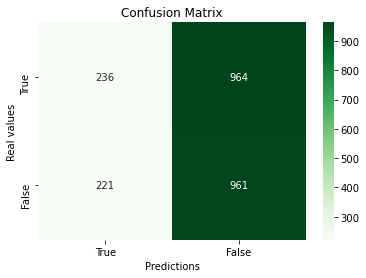

In [42]:
import seaborn as sns

ax = plt.subplot()
sns.heatmap(NB_cm, annot=True, fmt='g', ax=ax, cmap='Greens');

#Tags
ax.set_xlabel('Predictions');ax.set_ylabel('Real values');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['True', 'False']);

## Decision Tree

In [37]:
#Create decision tree
from sklearn.tree import DecisionTreeClassifier
DT_classifier = DecisionTreeClassifier()
DT_classifier.fit(x_train, y_train)

DecisionTreeClassifier()

In [43]:
#Predict
DT_pred = DT_classifier.predict(x_test)
DT_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [44]:
#Create confusion and precision matrix
from sklearn.metrics import confusion_matrix, accuracy_score
DT_cm = confusion_matrix(y_test, DT_pred)
DT_ac = accuracy_score(y_test, DT_pred)

In [45]:
#Confusion matrix
DT_cm

array([[611, 589],
       [585, 597]], dtype=int64)

In [46]:
#Accuracy
DT_ac

0.5071368597816961

### Confusion matrix plot

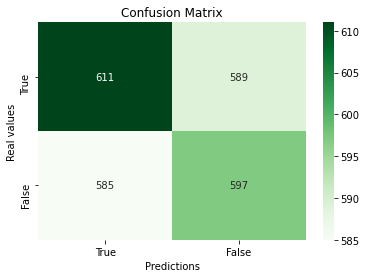

In [49]:
import seaborn as sns

ax = plt.subplot()
sns.heatmap(DT_cm, annot=True, fmt='g', ax=ax, cmap='Greens');

#Tags
ax.set_xlabel('Predictions');ax.set_ylabel('Real values');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['True', 'False']);

### Decision Tree plot

In [51]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

In [52]:
feature_cols = ['NombreCiudad','Genero','ID_Parte', 'ID_Categoria']
dot_data = StringIO()
export_graphviz(DT_classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['True','False'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dt.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.358831 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.358831 to fit



## Random Forest

In [53]:
from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics

In [54]:
#Create random forest
RF_classifier = RandomForestClassifier(criterion = 'entropy', random_state = 42)
RF_classifier.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=42)

In [55]:
#Predict
RF_pred = RF_classifier.predict(x_test)

In [56]:
#Accuracy
print('Testing Set Evaluation F1-Score=>',metrics.accuracy_score(y_test,RF_pred))

Testing Set Evaluation F1-Score=> 0.5075566750629723
